> Martin Fridrich, 03/2021

# Exploration of the user churn model

This document inspects the original user churn model dataset. The endevours are structured as follows:

1 [Housekeepin'](#housekeepin)  
2 [Fundamental characteristics](#fundamental-characteristics)  
3 [Correlation matrix & pair-plot](#correlation-matrix--pair-plot)  
4 [Correlation dendogram & heatmap](#correlation-dendogram--heatmap)  
5 [T-SNE](#t-sne)  
6 [Next steps](#next-steps)

# Housekeepin'

In the opening section, we load most of the libs and the `user-churn-model-data.csv`. Also, we downcasted the numerical columns.

In [1]:
# set options
import warnings  
warnings.filterwarnings('ignore')
import pandas as pd
pd.set_option("notebook_repr_html", False)

# general
import numpy as np
from itertools import combinations, product
from collections import OrderedDict
from scipy.cluster import hierarchy
from scipy.stats import pearsonr, kendalltau, ttest_rel

# plotting
from cairosvg import svg2png
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.colors import rgb2hex
import seaborn as sns

# pipes & pints
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler

# preprocessing & dr
from sklearn.preprocessing import QuantileTransformer, StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA

# others
from sklearn.manifold import TSNE
plt.rcParams['figure.dpi'] = 450
plt.rcParams['savefig.dpi'] = 450

In [2]:
def downcast_dtype(column_series):
    """Try to infer better dtype.
    
        Parameters>
            column_series: pd.Series, a column to down
            
        Returns>
            pd.Series, converted column"""        
    
    conv_dict = {"int":"integer", "float":"float"}
    for k in conv_dict.keys():
        if k in str(column_series.dtype):
            return pd.to_numeric(column_series, downcast=conv_dict[k])

In [3]:
classification_data = pd.read_csv("../data/ecom-user-churn-data.csv")
classification_data = classification_data.loc[:,"ses_rec":"target_class"]
classification_data = classification_data.apply(downcast_dtype, axis=0)

# Fundamental characteristics

Here we focus purely on basic descriptive properties such as mju, sd, range & percentiles.

In [4]:
# describes
classification_data.describe()

            ses_rec   ses_rec_avg    ses_rec_sd    ses_rec_cv      user_rec  \
count  49358.000000  49358.000000  49358.000000  49358.000000  49358.000000   
mean      15.454840     11.231611      2.711962     -0.020100     33.822948   
std        9.184645     18.162743      6.583917      0.917701     25.237703   
min        0.000000      0.000000      0.000000     -1.000000      0.000000   
25%        7.000000      0.000000      0.000000     -1.000000     16.000000   
50%       16.000000      2.250000      0.000000      0.000000     26.000000   
75%       23.000000     14.250000      1.000000      0.638646     46.000000   
max       31.000000     99.000000     47.500000     11.525121     99.000000   

              ses_n       ses_n_r         int_n       int_n_r        tran_n  \
count  49358.000000  49358.000000  49358.000000  49358.000000  49358.000000   
mean       3.366445      0.172372      6.716277      1.720975      0.111248   
std        7.380573      0.372614     38.528881    

In [93]:
from scipy.stats import skew, skewtest, kurtosis, kurtosistest

# push out the stats
def get_stats(x):
    out_vec = [x.mean(), x.std(), x.min(), x.max(), x.median(),
        skew(x), kurtosis(x),
        1.0-np.sum(x!=-1)/len(x), 1.0-(np.count_nonzero(x)/len(x))]
    return out_vec  
stats_data = classification_data.apply(get_stats)

stats_data["stats"] = ["mean", "std", "min","max", "median",
    "skew", "kurt", "miss", "sparse"]
stats_data.set_index("stats", inplace=True)
stats_data.T.to_csv("../data/ecom-user-churn-stats.csv")

From the print-out above, one can see that most of the variable distributions are heavily skewed. Besides, the `target_class` is imbalanced with ~ 89 % of observations in the class 1 (churners). In the next step, we obtain Pearson's correlation and asymptotic p-value for each pair of variables. Let's check the strong relationship with the explained variable.

# Correlation matrix & pair-plot

In this section, we construct correlation matrix with pearson corr coef & extract asymptotic p-value.

In [5]:
# correlation matrix
prod = list(product(classification_data.columns,repeat=2))
corr_ls = []
for c in prod:
    stat, pval = pearsonr(classification_data[c[0]],classification_data[c[1]])
    corr_ls.append([c[0], c[1], stat, pval])

corr_df = pd.DataFrame(corr_ls)
corr_df.columns = ["from", "to", "rho", "pvalue"]
corr_df.dropna(inplace=True)

# check the significant correlations with the target
cf = np.logical_or([f == "target_class" for f in corr_df["from"]],
    [t == "target_class" for t in corr_df["to"]])
cf = np.logical_and(cf, corr_df.pvalue*1000<0.05)

display(corr_df[cf].sort_values("rho").head(3))
display(corr_df[cf].sort_values("rho").tail(3))

              from            to       rho         pvalue
2259  target_class    ses_rec_cv -0.203530   0.000000e+00
191     ses_rec_cv  target_class -0.203530   0.000000e+00
287          ses_n  target_class -0.153246  4.703763e-257

              from            to       rho  pvalue
47         ses_rec  target_class  0.192396     0.0
2256  target_class       ses_rec  0.192396     0.0
2303  target_class  target_class  1.000000     0.0

From the printout, we see that the recency coefficient of variation is negatively correlated with the target, ie higher cv in recency high number of sessions lead towards more loyal behavior. Users with recent session might be also more easily retained.

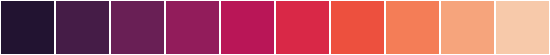

In [6]:
# check target color pallete
cp = sns.color_palette("rocket", n_colors=10)
Image(data=svg2png(cp._repr_html_()))

In the next code chunk, we visualize explanatory variables with the highest absolute correlation with the explained variable. The pair-plot enables us to observe behavior of the explained variable across the explanatory vars through the scatter plots & kernel density estimates. To construct the plot, we use under-sampled dataset.

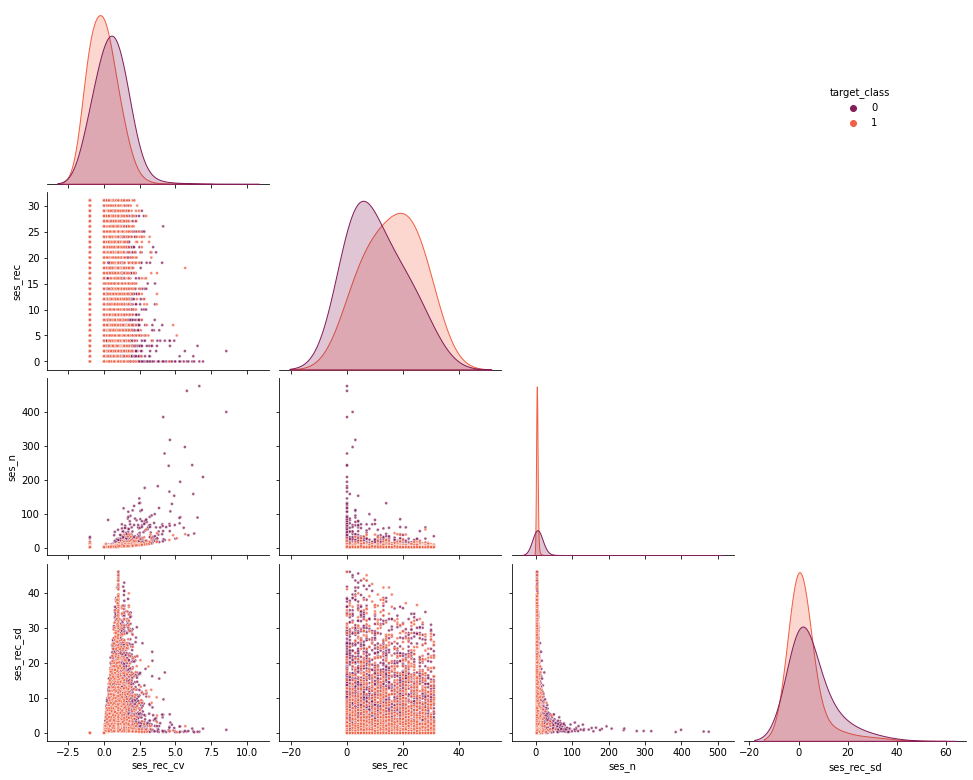

In [7]:
# pair plot
features = classification_data.loc[:,"ses_rec":"int_cat24_n"].columns
plot_df = pd.concat(RandomUnderSampler(random_state=2021).fit_resample(classification_data[features],
    classification_data.target_class), axis=1, ignore_index=False)

g = sns.pairplot(plot_df,
    hue="target_class", hue_order=[0,1], markers=".", palette=sns.color_palette("rocket", n_colors=2),
    vars=["ses_rec_cv", "ses_rec", "ses_n", "ses_rec_sd"], aspect=1.25, height=2.75, corner=True,
    diag_kws=dict(bw=0.75), plot_kws=dict(alpha=0.75));
g._legend.set_bbox_to_anchor((0.85, 0.85));
plt.show();    

From the pair-plot, one can see some degree of class separation in every feature/feature pairs. Ie `ses_rec` shows that users with more recent sessions tend to be retained. From the pairs we see that users with low `ses_rec_sd` & high `ses_n` tend to be more loyal, which is also aligned with our expectations.

# Correlation dendogram & heatmap

To examine the behavior of the variables in more detail, we use agglomerative clustering with ward linkage on the correlation matrix & present the tree & related matrix below.

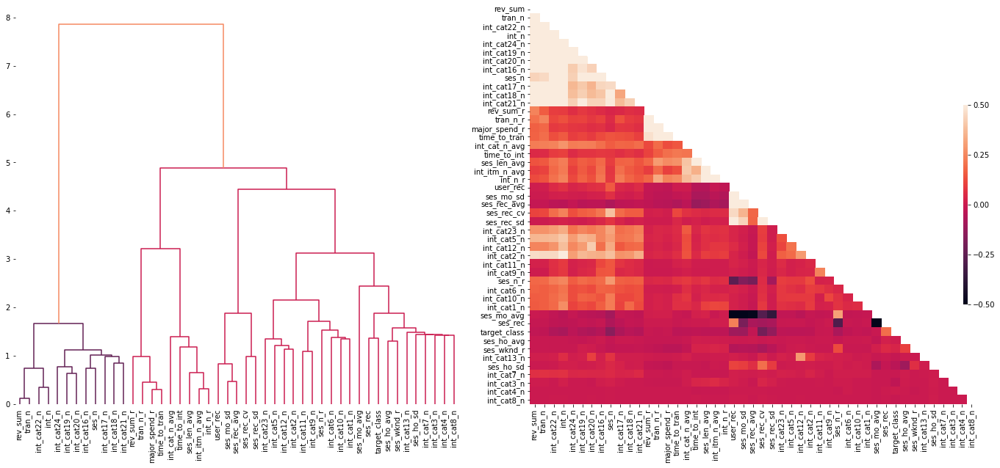

In [8]:
corr = pd.pivot_table(corr_df, index="from", columns="to", values="rho", fill_value=0)
corr_linkage = hierarchy.ward(corr)

fig, axs = plt.subplots(1, 2, figsize=(21, 10), gridspec_kw={"width_ratios": [1, 1.15], "wspace":0.15})

color_links = [rgb2hex(c) for c in sns.color_palette("rocket", n_colors=3)]
hierarchy.set_link_color_palette(color_links)
dendro = hierarchy.dendrogram(corr_linkage, labels=corr.columns,
    ax=axs[0], leaf_font_size=10, leaf_rotation=90, above_threshold_color=color_links[2])
hierarchy.set_link_color_palette(None)    
for s in axs[0].spines.keys():
    axs[0].spines[s].set_visible(False)
dendro_idx = np.arange(0, len(dendro["ivl"]))

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True 

sns.heatmap(corr.iloc[dendro["leaves"], :].iloc[:, dendro["leaves"]], ax=axs[1],
    vmin=-0.5, vmax=0.5, mask=mask, #square=True,
    cbar_kws={"aspect":50, "shrink":0.5, "pad":-0.025, "ticks":[-0.5,-0.25,0,0.25,0.5]}, annot_kws={"size":10})

axs[1].set_ylabel(""); axs[1].set_xlabel("");
fig.tight_layout();
plt.show();

From the dendrongram & heatmap, we see strong correlations amongst the explanatory variables.  We will have to address the issue in the modeling process. The closest feature to the explained variable is `ses_rec`, which is somewhat expected. Interestingly, the closest cluster of features is based on session & category information (see the lower right corner of the dendogram).

# T-SNE

To see the overall feature space, we employ combine unders-sampled dataset with pca to construct the t-distributed stochasting neighbour embeddings & color the observations according to target class.

In [9]:
# user embeddings
tsne_pipe = Pipeline([("zv", VarianceThreshold()),
("scaler", StandardScaler()),("pca", PCA(n_components=30)),
("tsne", TSNE(n_jobs=8, perplexity=50,
    learning_rate=10, n_iter=1000))])

embedded_df = pd.DataFrame(tsne_pipe.fit_transform(plot_df[features]))
embedded_df.columns = ["c"+str(c+1) for c in embedded_df.columns]
embedded_df["target_class"] =  plot_df.target_class

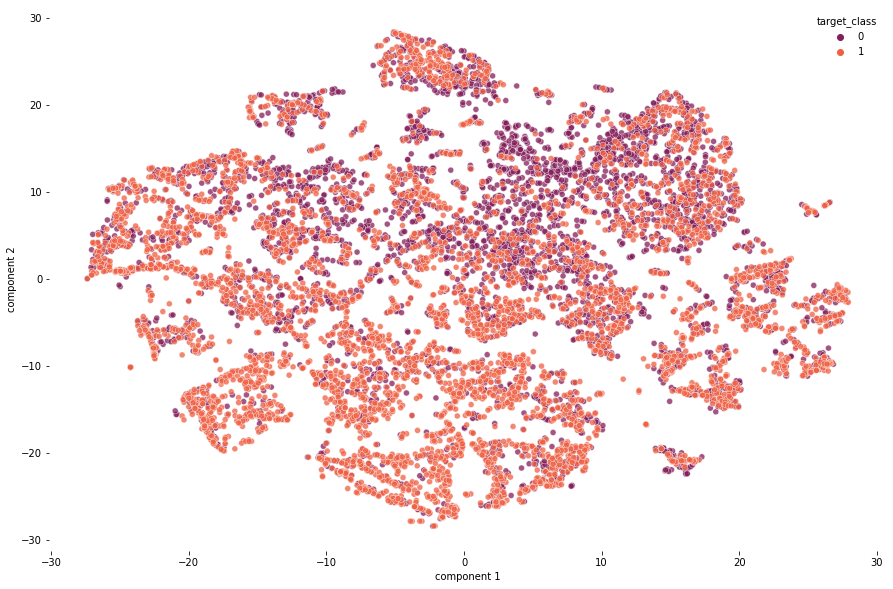

In [10]:
f, ax = plt.subplots(figsize=(15,10))
sns.scatterplot(data=embedded_df,x="c1",y="c2", hue="target_class", hue_order=[0,1],
    markers=".", palette=sns.color_palette("rocket", n_colors=2), ax=ax, alpha=0.75);
ax.set_xlabel("component 1");
ax.set_ylabel("component 2");
ax.legend(frameon=False, title="target_class");
for s in ax.spines.keys():
    ax.spines[s].set_visible(False)
plt.show()

Unfortunately, the T-SNE plot does not show clear separation, which might indicate need for a bit more feature engineering within the machine learning pipeline.

# Next steps

**Modeling**  
 * address the heavily skewed distributions with scaling (quantile, robust, power-transformation),
 * consider tackling the class imbalance with sampling,
 * remove multicollinearity with PCA and/or implement more advanced feature extraction methods,
 * ...

**Visuals**
 * inspect new plotting options,
 * ...

> Martin Fridrich, 03/2021